In [17]:
import os
import os.path as osp
import mmcv
import mmdet
import numpy as np
import matplotlib.pyplot as plt
import sys
import glob
import os.path as osp
from visdrone.utils import result_utils
os.chdir('/home/damon/Github/mmlab/mmdetection/')
%load_ext autoreload
%autoreload 2
sys.path.append('/home/damon/detorch/')
from visualization_utils import *
from debug_utils import *
from visdrone.utils import MergeTxt
from visdrone.utils.vid import vid_test

swap = lambda b: np.stack([b[:, 1], b[:, 0], b[:, 3], b[:, 2]], 1)
def draw_bb(img, boxes):
    # xywh
    b = np.copy(boxes)
    return draw_bounding_boxes_on_image_array(img, boxes=swap(b))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# On 'images'

In [4]:
omentxtdit = '/tmp/6406401500/'
d = MergeTxt.read_origin(omentxtdit)

from visdrone.utils.test_augs import *
from mmdet.datasets import get_dataset
from mmdet.datasets import extra_aug
from visdrone.utils import MergeTxt
# imgdir = '/home/damon/DATASETS/Drone2019/VisDrone2019-DET/VisDrone2018-DET-val/images/'
cfg = 'visdrone/configs/ssd300.py'
cfg = mmcv.Config.fromfile(cfg)
cfg.data.test.ann_file = '/home/damon/DATASETS/Drone2019/VisDrone2019-VID/VisDrone2018-VID-val-DET/annotations_val.json'
cfg.data.test.img_prefix = '/home/damon/DATASETS/Drone2019/VisDrone2019-VID/VisDrone2018-VID-val-DET'
ds = get_dataset(cfg.data.test)

idx = 0
img_info = ds.img_infos[idx]
# load image

loading annotations into memory...
Done (t=0.24s)
creating index...
index created!
load_annotations time: 0.3s from /home/damon/DATASETS/Drone2019/VisDrone2019-VID/VisDrone2018-VID-val-DET/annotations_val.json


In [41]:
txtdir = '/tmp/vid8966401333/'
txtdir = tmpdir
d = MergeTxt.read_origin(txtdir)

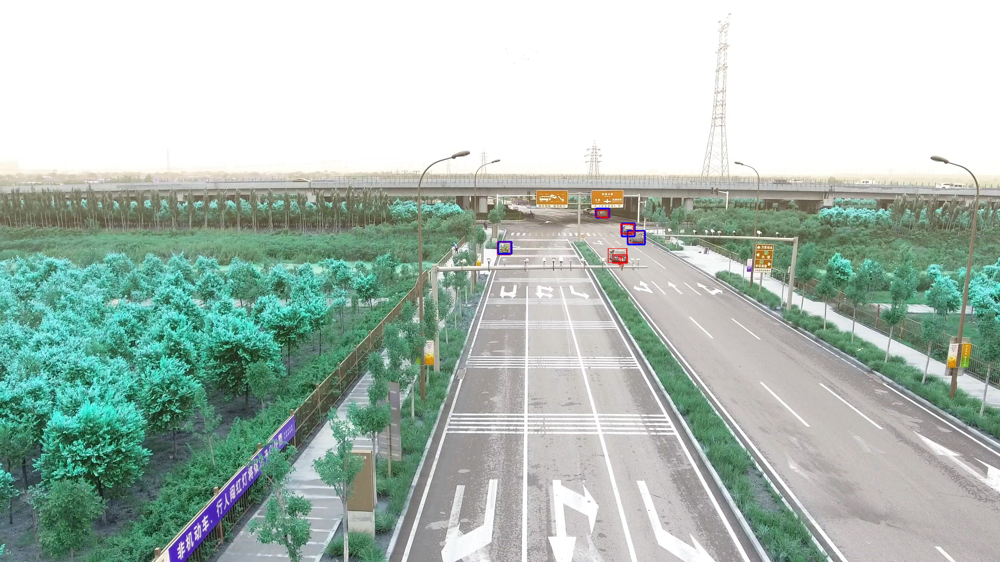

In [59]:
key = np.random.choice(list(d.keys()))
# key = '0000289_03601_d_0000829'
fname = key + '.jpg'
fname = '/'.join(['images', fname])
img = mmcv.imread(osp.join(ds.img_prefix, fname))
idx = [i for i, v in enumerate(ds.img_infos) if v['file_name'] == fname][0]
ann = ds.get_ann_info(idx)
gt_bboxes = ann['bboxes']
gt_ignore = ann['bboxes_ignore']
gt_labels = ann['labels']

dets = np.concatenate(d[key], 0)
dets = dets[dets[:, -1] > 0.1]

ret = draw_bounding_boxes_on_image_array(ret, boxes=swap(gt_ignore), color='green', thickness=6)
ret = draw_bounding_boxes_on_image_array(img, boxes=swap(gt_bboxes), color='blue', thickness=7)
ret = draw_bounding_boxes_on_image_array(ret, boxes=swap(dets), color='red', thickness=2)
visualize_image_array(ret)

In [19]:
vid_test.frames_dets2dict_then_output(txtdir, '/tmp/vidout')

In [30]:
# Image Patches

In [37]:
import tempfile
tmpdir = tempfile.mkdtemp()[1]

In [63]:
patchdir = '/tmp/vid8968961333New_patch/'
nms_param = dict(iou_thr=0.5, max_det=100, score_thr=0.2)
MergeTxt.read_txtdir_with_output(patchdir, out_dir=tmpdir)
MergeTxt.frames_dets2dict_then_output(tmpdir, '/tmp/vidout')

In [79]:
import subprocess 
for i in range(10):
    bashcmd = ['bash', '/tmp/run.sh', str(i)]
    proc = subprocess.check_output(bashcmd, cwd='/home/damon/Github/')
#     output, error = proc.communicate()